In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np

In [3]:
import pandas as pd

In [4]:
import xarray as xr

In [5]:
import gzip
import pathlib
import shutil
import requests
def download_data(url, data_dir="data", unarchive=False, clobber=False):
    data_dir = pathlib.Path(data_dir)
    data_dir.mkdir(parents=True, exist_ok=True)
    local_filename = data_dir / url.split('/')[-1]
    if (local_filename.exists() and clobber) or not local_filename.exists():
        with requests.get(url, stream=True) as rstream:
            with local_filename.open("wb") as f:
                shutil.copyfileobj(rstream.raw, f)
    if unarchive:
        local_filename_unarchived = data_dir / local_filename.stem
        if (
            local_filename_unarchived.exists() and clobber
        ) and not local_filename_unarchived.exists():
            with gzip.open(local_filename, "rb") as fin:
                with local_filename_unarchived.open("wb") as fout:
                    shutil.copyfileobj(fin, fout)
        return str(local_filename_unarchived)
    return local_filename

In [6]:
urls = [
    ("http://download.ecmwf.int/test-data/cfgrib/era5-levels-members.grib", False),
    ("https://psl.noaa.gov/thredds/fileServer/Datasets/noaa.oisst.v2/sst.mnmean.nc", False),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Amon/tas/gn/v20190514/tas_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Amon/ta/gn/v20190514/ta_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Ofx/areacello/gr/v20190514/areacello_Ofx_CESM2_historical_r11i1p1f1_gr.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r11i1p1f1/Omon/tos/gr/v20190514/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r9i1p1f1/Omon/tos/gr/v20190311/tos_Omon_CESM2_historical_r9i1p1f1_gr_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r7i1p1f1/Omon/tos/gr/v20190311/tos_Omon_CESM2_historical_r7i1p1f1_gr_200001-201412.nc",
        False,
    ),
    (
        "http://esgf-data1.llnl.gov/thredds/fileServer/css03_data/CMIP6/CMIP/NCAR/CESM2/historical/r8i1p1f1/Omon/tos/gr/v20190311/tos_Omon_CESM2_historical_r8i1p1f1_gr_200001-201412.nc",
        False,
    ),
]
for url, unarchive in urls:
    download_data(url, unarchive=unarchive)

In [7]:
ds = xr.open_dataset("./data/tas_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc", engine="netcdf4")

In [8]:
ds.info()

xarray.Dataset {
dimensions:
	time = 180 ;
	lat = 192 ;
	lon = 288 ;
	nbnd = 2 ;

variables:
	float32 tas(time, lat, lon) ;
		tas:cell_measures = area: areacella ;
		tas:cell_methods = area: time: mean ;
		tas:comment = TREFHT ;
		tas:description = near-surface (usually, 2 meter) air temperature ;
		tas:frequency = mon ;
		tas:id = tas ;
		tas:long_name = Near-Surface Air Temperature ;
		tas:mipTable = Amon ;
		tas:out_name = tas ;
		tas:prov = Amon ((isd.003)) ;
		tas:realm = atmos ;
		tas:standard_name = air_temperature ;
		tas:time = time ;
		tas:time_label = time-mean ;
		tas:time_title = Temporal mean ;
		tas:title = Near-Surface Air Temperature ;
		tas:type = real ;
		tas:units = K ;
		tas:variable_id = tas ;
	float64 lat(lat) ;
		lat:axis = Y ;
		lat:bounds = lat_bnds ;
		lat:standard_name = latitude ;
		lat:title = Latitude ;
		lat:type = double ;
		lat:units = degrees_north ;
		lat:valid_max = 90.0 ;
		lat:valid_min = -90.0 ;
	float64 lon(lon) ;
		lon:axis = X ;
		lon:bounds =

In [9]:
# variables that are in our dataset
ds.data_vars

Data variables:
    tas        (time, lat, lon) float32 ...
    time_bnds  (time, nbnd) object ...
    lat_bnds   (lat, nbnd) float64 ...
    lon_bnds   (lon, nbnd) float64 ...

In [10]:
# dataset dimensions
ds.dims

Frozen({'time': 180, 'lat': 192, 'lon': 288, 'nbnd': 2})

In [11]:
# dataset coordinates
ds.coords

Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [12]:
# dataset global attributes
ds.attrs

{'Conventions': 'CF-1.7 CMIP-6.2',
 'activity_id': 'CMIP',
 'branch_method': 'standard',
 'branch_time_in_child': 674885.0,
 'branch_time_in_parent': 219000.0,
 'case_id': '972',
 'cesm_casename': 'b.e21.BHIST.f09_g17.CMIP6-historical.011',
 'contact': 'cesm_cmip6@ucar.edu',
 'creation_date': '2019-04-02T05:28:31Z',
 'data_specs_version': '01.00.29',
 'experiment': 'Simulation of recent past (1850 to 2014). Impose changing conditions (consistent with observations). Should be initialised from a point early enough in the pre-industrial control run to ensure that the end of all the perturbed runs branching from the end of this historical run end before the end of the control. Only one ensemble member is requested but modelling groups are strongly encouraged to submit at least three ensemble members of their CMIP historical simulation. ',
 'experiment_id': 'historical',
 'external_variables': 'areacella',
 'forcing_index': 1,
 'frequency': 'mon',
 'further_info_url': 'https://furtherinfo.e

In [13]:
# Extract the tas variable (dataarray)
ds["tas"]

<xarray.DataArray 'tas' (time: 180, lat: 192, lon: 288)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [14]:
# ds["tas"] is equivalent to ds.tas
ds.tas

<xarray.DataArray 'tas' (time: 180, lat: 192, lon: 288)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [15]:
# The actual array data
ds["tas"].data

array([[[247.15303, 247.15302, 247.15302, ..., 247.153  , 247.15302,
         247.15302],
        [247.80325, 247.74376, 247.56442, ..., 247.91016, 247.88065,
         247.84268],
        [248.37344, 248.29222, 248.23836, ..., 248.71902, 248.63567,
         248.52878],
        ...,
        [240.68915, 240.70212, 240.7148 , ..., 240.6477 , 240.66093,
         240.6746 ],
        [240.98354, 240.9889 , 240.99457, ..., 240.96875, 240.97357,
         240.97845],
        [241.1705 , 241.17052, 241.17053, ..., 241.17044, 241.17046,
         241.17047]],

       [[236.51689, 236.51689, 236.51689, ..., 236.51689, 236.51689,
         236.51689],
        [236.9432 , 236.89592, 236.73224, ..., 236.99376, 236.97823,
         236.96432],
        [237.28722, 237.2335 , 237.1985 , ..., 237.55449, 237.49416,
         237.40793],
        ...,
        [241.329  , 241.3181 , 241.30516, ..., 241.35661, 241.34663,
         241.33691],
        [241.3106 , 241.30481, 241.29861, ..., 241.32701, 241.32219,
   

In [16]:
# datarray coordinates
ds["tas"].coords

Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [17]:
# dataarray attributes
ds["tas"].attrs

{'cell_measures': 'area: areacella',
 'cell_methods': 'area: time: mean',
 'comment': 'TREFHT',
 'description': 'near-surface (usually, 2 meter) air temperature',
 'frequency': 'mon',
 'id': 'tas',
 'long_name': 'Near-Surface Air Temperature',
 'mipTable': 'Amon',
 'out_name': 'tas',
 'prov': 'Amon ((isd.003))',
 'realm': 'atmos',
 'standard_name': 'air_temperature',
 'time': 'time',
 'time_label': 'time-mean',
 'time_title': 'Temporal mean',
 'title': 'Near-Surface Air Temperature',
 'type': 'real',
 'units': 'K',
 'variable_id': 'tas'}

In [18]:
ds

<xarray.Dataset>
Dimensions:    (time: 180, lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Dimensions without coordinates: nbnd
Data variables:
    tas        (time, lat, lon) float32 247.2 247.2 247.2 ... 252.9 252.9 252.9
    time_bnds  (time, nbnd) object ...
    lat_bnds   (lat, nbnd) float64 ...
    lon_bnds   (lon, nbnd) float64 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Amon
    tracking_id:            hdl:21.14100/a7278f6d-6a1b-4050-8f06-a8033604736a
    variable_id:            tas
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [19]:
with xr.set_options(display_style="text"):
    print(ds)

<xarray.Dataset>
Dimensions:    (time: 180, lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Dimensions without coordinates: nbnd
Data variables:
    tas        (time, lat, lon) float32 247.2 247.2 247.2 ... 252.9 252.9 252.9
    time_bnds  (time, nbnd) object 2000-01-01 00:00:00 ... 2015-01-01 00:00:00
    lat_bnds   (lat, nbnd) float64 -90.0 -89.53 -89.53 ... 89.53 89.53 90.0
    lon_bnds   (lon, nbnd) float64 -0.625 0.625 0.625 ... 358.1 358.1 359.4
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:   

In [20]:
url = "http://crd-esgf-drc.ec.gc.ca/thredds/dodsC/esgD_dataroot/AR6/CMIP6/ScenarioMIP/CCCma/CanESM5/ssp126/r12i1p2f1/Amon/wap/gn/v20190429/wap_Amon_CanESM5_ssp126_r12i1p2f1_gn_201501-210012.nc"

In [21]:
xr.open_dataset(url, engine="netcdf4", chunks={})

<xarray.Dataset>
Dimensions:    (time: 1032, bnds: 2, plev: 19, lat: 64, lon: 128)
Coordinates:
  * time       (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
  * plev       (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * lat        (lat) float64 -87.86 -85.1 -82.31 -79.53 ... 82.31 85.1 87.86
  * lon        (lon) float64 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) object dask.array<chunksize=(1032, 2), meta=np.ndarray>
    lat_bnds   (lat, bnds) float64 dask.array<chunksize=(64, 2), meta=np.ndarray>
    lon_bnds   (lon, bnds) float64 dask.array<chunksize=(128, 2), meta=np.ndarray>
    wap        (time, plev, lat, lon) float32 dask.array<chunksize=(1032, 19, 64, 128), meta=np.ndarray>
Attributes: (12/54)
    CCCma_model_hash:                f40814ae97970257f253e53802f6dcb79ec2bb26
    CCCma_parent_runid:              p2-his12
    CCCma_pycmor_hash:               26c970628162d607fffd14254956ebc6dd3b6f49
    CCCma_runid:                     p2-s2612
    Conventions:                     CF-1.7 CMIP-6.2
    YMDH_branch_time_in_child:       2015:01:01:00
    ...                              ...
    variable_id:                     wap
    variant_label:                   r12i1p2f1
    version:                         v20190429
    license:                         CMIP6 model data produced by The Governm...
    cmor_version:                    3.5.0
    DODS_EXTRA.Unlimited_Dimension:  time

In [22]:
temp = ds["tas"].data  # retrieve numpy array
temp

array([[[247.15303, 247.15302, 247.15302, ..., 247.153  , 247.15302,
         247.15302],
        [247.80325, 247.74376, 247.56442, ..., 247.91016, 247.88065,
         247.84268],
        [248.37344, 248.29222, 248.23836, ..., 248.71902, 248.63567,
         248.52878],
        ...,
        [240.68915, 240.70212, 240.7148 , ..., 240.6477 , 240.66093,
         240.6746 ],
        [240.98354, 240.9889 , 240.99457, ..., 240.96875, 240.97357,
         240.97845],
        [241.1705 , 241.17052, 241.17053, ..., 241.17044, 241.17046,
         241.17047]],

       [[236.51689, 236.51689, 236.51689, ..., 236.51689, 236.51689,
         236.51689],
        [236.9432 , 236.89592, 236.73224, ..., 236.99376, 236.97823,
         236.96432],
        [237.28722, 237.2335 , 237.1985 , ..., 237.55449, 237.49416,
         237.40793],
        ...,
        [241.329  , 241.3181 , 241.30516, ..., 241.35661, 241.34663,
         241.33691],
        [241.3106 , 241.30481, 241.29861, ..., 241.32701, 241.32219,
   

In [23]:
temp.shape, temp.ndim

((180, 192, 288), 3)

In [24]:
temp[:, 20, 40]

array([249.35709, 242.70848, 233.85196, 230.14656, 231.67372, 231.29622,
       224.35321, 228.38821, 224.2478 , 231.22375, 240.94699, 249.31131,
       250.24495, 241.61522, 236.21939, 229.20222, 229.01112, 228.58128,
       227.76715, 229.69951, 226.74802, 232.02487, 242.93288, 249.00883,
       248.39995, 244.34932, 237.04355, 231.60507, 228.28485, 228.24316,
       228.92952, 226.09521, 228.75298, 233.51196, 239.62282, 246.17621,
       251.02736, 240.37634, 237.1707 , 231.19572, 226.97052, 227.10672,
       230.3411 , 224.54344, 226.81474, 231.62906, 242.2913 , 249.02495,
       248.7835 , 241.25914, 233.90482, 230.22385, 228.71094, 227.09296,
       227.03525, 226.98312, 224.38362, 232.68932, 242.05833, 248.97253,
       249.97127, 242.68843, 236.90999, 231.70335, 226.32764, 229.11913,
       228.33737, 225.4346 , 227.41531, 234.0796 , 241.91693, 248.59215,
       247.3342 , 243.11838, 236.0711 , 231.07973, 227.78763, 224.06044,
       228.52187, 224.75647, 225.76625, 234.37967, 

In [25]:
ds.tas.isel()  # the original object i.e. no selection

<xarray.DataArray 'tas' (time: 180, lat: 192, lon: 288)>
array([[[247.15303, 247.15302, ..., 247.15302, 247.15302],
        [247.80325, 247.74376, ..., 247.88065, 247.84268],
        ...,
        [240.98354, 240.9889 , ..., 240.97357, 240.97845],
        [241.1705 , 241.17052, ..., 241.17046, 241.17047]],

       [[236.51689, 236.51689, ..., 236.51689, 236.51689],
        [236.9432 , 236.89592, ..., 236.97823, 236.96432],
        ...,
        [241.3106 , 241.30481, ..., 241.32219, 241.31647],
        [241.32259, 241.32254, ..., 241.32271, 241.32265]],

       ...,

       [[235.53151, 235.53151, ..., 235.53151, 235.53151],
        [236.374  , 236.32649, ..., 236.41884, 236.39745],
        ...,
        [259.4753 , 259.47998, ..., 259.46725, 259.47116],
        [259.7919 , 259.79153, ..., 259.79282, 259.79233]],

       [[250.03975, 250.03975, ..., 250.03976, 250.03975],
        [250.7029 , 250.66605, ..., 250.72278, 250.71268],
        ...,
        [253.26057, 253.28796, ..., 253.20187, 253.23189],
        [252.8665 , 252.86855, ..., 252.86179, 252.86426]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [26]:
ds.tas.isel(lat=100)

<xarray.DataArray 'tas' (time: 180, lon: 288)>
array([[301.03406, 301.086  , 301.10083, ..., 300.90924, 301.00153, 301.02826],
       [300.8836 , 300.8504 , 300.92484, ..., 301.13306, 301.07187, 300.9965 ],
       [301.37515, 301.41602, 301.3797 , ..., 301.3015 , 301.2557 , 301.29398],
       ...,
       [300.44745, 300.53033, 300.60065, ..., 300.5099 , 300.44482, 300.42026],
       [300.98123, 301.08792, 301.12793, ..., 300.82452, 300.79416, 300.8434 ],
       [301.2596 , 301.38248, 301.45828, ..., 301.04367, 301.0475 , 301.14404]],
      dtype=float32)
Coordinates:
    lat      float64 4.241
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [27]:
ds.tas.isel(lat=100, time=[-2, -1])

<xarray.DataArray 'tas' (time: 2, lon: 288)>
array([[300.98123, 301.08792, 301.12793, ..., 300.82452, 300.79416, 300.8434 ],
       [301.2596 , 301.38248, 301.45828, ..., 301.04367, 301.0475 , 301.14404]],
      dtype=float32)
Coordinates:
    lat      float64 4.241
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2014-11-15 00:00:00 2014-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [28]:
ds.tas.isel(lon=100, time=slice(10, 20))

<xarray.DataArray 'tas' (time: 10, lat: 192)>
array([[235.85551, 234.55927, 234.04126, ..., 252.19244, 252.12074, 251.8596 ],
       [245.92458, 244.82182, 244.25714, ..., 254.9857 , 254.38263, 253.71445],
       [244.74162, 243.65564, 243.38695, ..., 246.49345, 245.8732 , 244.89249],
       ...,
       [220.08241, 220.00351, 219.62608, ..., 271.70505, 271.8897 , 272.1107 ],
       [215.47134, 215.46117, 215.07767, ..., 272.68958, 272.60373, 272.59506],
       [218.88512, 218.10718, 217.67311, ..., 272.03568, 272.09183, 272.03326]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
    lon      float64 125.0
  * time     (time) object 2000-11-15 00:00:00 ... 2001-08-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [29]:
ds.tas.sel(time="2013")

<xarray.DataArray 'tas' (time: 12, lat: 192, lon: 288)>
array([[[251.0122 , 251.01219, ..., 251.01219, 251.01219],
        [251.75168, 251.70715, ..., 251.77245, 251.76056],
        ...,
        [246.26265, 246.28883, ..., 246.20654, 246.23535],
        [246.07198, 246.07327, ..., 246.06903, 246.07057]],

       [[237.78917, 237.78917, ..., 237.78917, 237.78917],
        [238.95834, 238.91258, ..., 238.98819, 238.97308],
        ...,
        [240.98769, 240.98885, ..., 240.98486, 240.98642],
        [240.97531, 240.97554, ..., 240.97476, 240.97505]],

       ...,

       [[239.45691, 239.45691, ..., 239.45691, 239.45691],
        [240.32988, 240.30064, ..., 240.33969, 240.33632],
        ...,
        [259.88977, 259.91068, ..., 259.848  , 259.86908],
        [260.16348, 260.1648 , ..., 260.16043, 260.16202]],

       [[248.43866, 248.43864, ..., 248.43866, 248.43858],
        [249.02176, 248.98167, ..., 249.04703, 249.03409],
        ...,
        [253.37564, 253.40202, ..., 253.31888, 253.34825],
        [253.26901, 253.27061, ..., 253.26532, 253.26726]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2013-01-15 12:00:00 ... 2013-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [30]:
ds.tas.sel(time=slice("2013-01-01", "2014-12-31"))

<xarray.DataArray 'tas' (time: 24, lat: 192, lon: 288)>
array([[[251.0122 , 251.01219, ..., 251.01219, 251.01219],
        [251.75168, 251.70715, ..., 251.77245, 251.76056],
        ...,
        [246.26265, 246.28883, ..., 246.20654, 246.23535],
        [246.07198, 246.07327, ..., 246.06903, 246.07057]],

       [[237.78917, 237.78917, ..., 237.78917, 237.78917],
        [238.95834, 238.91258, ..., 238.98819, 238.97308],
        ...,
        [240.98769, 240.98885, ..., 240.98486, 240.98642],
        [240.97531, 240.97554, ..., 240.97476, 240.97505]],

       ...,

       [[235.53151, 235.53151, ..., 235.53151, 235.53151],
        [236.374  , 236.32649, ..., 236.41884, 236.39745],
        ...,
        [259.4753 , 259.47998, ..., 259.46725, 259.47116],
        [259.7919 , 259.79153, ..., 259.79282, 259.79233]],

       [[250.03975, 250.03975, ..., 250.03976, 250.03975],
        [250.7029 , 250.66605, ..., 250.72278, 250.71268],
        ...,
        [253.26057, 253.28796, ..., 253.20187, 253.23189],
        [252.8665 , 252.86855, ..., 252.86179, 252.86426]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2013-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [31]:
ds.tas.sel(lat=39.5, lon=105.7, method='nearest')

<xarray.DataArray 'tas' (time: 180)>
array([262.42212, 270.32382, 278.02744, 284.3488 , 293.25583, 298.99918,
       300.52612, 297.69995, 290.17285, 283.19998, 276.20874, 267.84622,
       265.3969 , 271.87668, 277.46265, 287.8647 , 292.2344 , 296.8831 ,
       299.92737, 298.30875, 291.7864 , 284.56534, 277.4121 , 267.9837 ,
       267.01407, 269.7421 , 278.26392, 288.1295 , 295.69   , 296.7765 ,
       297.47452, 297.34897, 290.92914, 285.12503, 275.41315, 269.52313,
       270.34836, 271.50192, 280.4425 , 287.8625 , 293.02795, 296.28156,
       299.06955, 299.05276, 291.77768, 282.4997 , 276.39285, 270.58676,
       267.21237, 270.91025, 281.11908, 287.50314, 290.77524, 296.76663,
       300.13013, 299.584  , 293.09683, 284.41708, 276.48917, 271.1439 ,
       265.34262, 270.89792, 277.89838, 286.27054, 292.301  , 297.6358 ,
       300.18066, 297.39957, 290.1503 , 283.70972, 274.46173, 270.83188,
       267.2768 , 270.8219 , 276.92633, 286.0151 , 293.00873, 296.56555,
       298.21762, 298.12408, 291.13626, 283.44547, 276.59982, 271.13477,
       267.8631 , 272.82382, 277.06924, 288.78372, 290.6359 , 294.64703,
       299.5449 , 296.856  , 292.42624, 283.48538, 277.75186, 273.07843,
       268.08612, 270.60092, 274.60318, 282.9708 , 291.96896, 295.53333,
       299.63574, 297.7455 , 290.50516, 285.60638, 275.57184, 271.9274 ,
       268.94867, 272.37598, 279.25262, 286.847  , 292.295  , 295.5027 ,
       300.4961 , 297.5326 , 291.99866, 283.08932, 276.66614, 271.30875,
       269.84644, 273.5247 , 278.82794, 288.26575, 294.60513, 297.2515 ,
       301.69882, 298.76624, 291.93823, 284.82388, 275.93225, 270.62943,
       270.41272, 271.89618, 278.734  , 286.68945, 293.7474 , 296.6049 ,
       301.17947, 300.43378, 291.8476 , 283.5131 , 276.17276, 271.65326,
       265.8642 , 268.07227, 280.3459 , 286.1488 , 293.28336, 296.44278,
       300.34897, 300.04114, 293.95288, 283.60764, 277.09372, 271.61826,
       268.769  , 271.2471 , 277.20398, 287.82834, 293.26044, 296.98453,
       301.7728 , 298.45126, 292.64316, 282.6202 , 277.466  , 271.37894,
       269.74258, 270.59058, 279.58582, 288.12704, 293.4532 , 297.16147,
       300.95575, 299.9192 , 291.52426, 283.96085, 277.2278 , 269.13263],
      dtype=float32)
Coordinates:
    lat      float64 39.11
    lon      float64 106.2
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [32]:
ds.tas.sel(lat=slice(39, 39.5), lon=slice(106.1, 106.3))

<xarray.DataArray 'tas' (time: 180, lat: 1, lon: 1)>
array([[[262.42212]],

       [[270.32382]],

       [[278.02744]],

       [[284.3488 ]],

       [[293.25583]],

       [[298.99918]],

       [[300.52612]],

       [[297.69995]],

       [[290.17285]],

       [[283.19998]],

       [[276.20874]],

       [[267.84622]],

       [[265.3969 ]],

       [[271.87668]],

       [[277.46265]],

       [[287.8647 ]],

       [[292.2344 ]],

       [[296.8831 ]],

       [[299.92737]],

       [[298.30875]],

       [[291.7864 ]],

       [[284.56534]],

       [[277.4121 ]],

       [[267.9837 ]],

       [[267.01407]],

       [[269.7421 ]],

       [[278.26392]],

       [[288.1295 ]],

       [[295.69   ]],

       [[296.7765 ]],

       [[297.47452]],

       [[297.34897]],

       [[290.92914]],

       [[285.12503]],

       [[275.41315]],

       [[269.52313]],

       [[270.34836]],

       [[271.50192]],

       [[280.4425 ]],

       [[287.8625 ]],

       [[293.02795]],

       [[296.28156]],

       [[299.06955]],

       [[299.05276]],

       [[291.77768]],

       [[282.4997 ]],

       [[276.39285]],

       [[270.58676]],

       [[267.21237]],

       [[270.91025]],

       [[281.11908]],

       [[287.50314]],

       [[290.77524]],

       [[296.76663]],

       [[300.13013]],

       [[299.584  ]],

       [[293.09683]],

       [[284.41708]],

       [[276.48917]],

       [[271.1439 ]],

       [[265.34262]],

       [[270.89792]],

       [[277.89838]],

       [[286.27054]],

       [[292.301  ]],

       [[297.6358 ]],

       [[300.18066]],

       [[297.39957]],

       [[290.1503 ]],

       [[283.70972]],

       [[274.46173]],

       [[270.83188]],

       [[267.2768 ]],

       [[270.8219 ]],

       [[276.92633]],

       [[286.0151 ]],

       [[293.00873]],

       [[296.56555]],

       [[298.21762]],

       [[298.12408]],

       [[291.13626]],

       [[283.44547]],

       [[276.59982]],

       [[271.13477]],

       [[267.8631 ]],

       [[272.82382]],

       [[277.06924]],

       [[288.78372]],

       [[290.6359 ]],

       [[294.64703]],

       [[299.5449 ]],

       [[296.856  ]],

       [[292.42624]],

       [[283.48538]],

       [[277.75186]],

       [[273.07843]],

       [[268.08612]],

       [[270.60092]],

       [[274.60318]],

       [[282.9708 ]],

       [[291.96896]],

       [[295.53333]],

       [[299.63574]],

       [[297.7455 ]],

       [[290.50516]],

       [[285.60638]],

       [[275.57184]],

       [[271.9274 ]],

       [[268.94867]],

       [[272.37598]],

       [[279.25262]],

       [[286.847  ]],

       [[292.295  ]],

       [[295.5027 ]],

       [[300.4961 ]],

       [[297.5326 ]],

       [[291.99866]],

       [[283.08932]],

       [[276.66614]],

       [[271.30875]],

       [[269.84644]],

       [[273.5247 ]],

       [[278.82794]],

       [[288.26575]],

       [[294.60513]],

       [[297.2515 ]],

       [[301.69882]],

       [[298.76624]],

       [[291.93823]],

       [[284.82388]],

       [[275.93225]],

       [[270.62943]],

       [[270.41272]],

       [[271.89618]],

       [[278.734  ]],

       [[286.68945]],

       [[293.7474 ]],

       [[296.6049 ]],

       [[301.17947]],

       [[300.43378]],

       [[291.8476 ]],

       [[283.5131 ]],

       [[276.17276]],

       [[271.65326]],

       [[265.8642 ]],

       [[268.07227]],

       [[280.3459 ]],

       [[286.1488 ]],

       [[293.28336]],

       [[296.44278]],

       [[300.34897]],

       [[300.04114]],

       [[293.95288]],

       [[283.60764]],

       [[277.09372]],

       [[271.61826]],

       [[268.769  ]],

       [[271.2471 ]],

       [[277.20398]],

       [[287.82834]],

       [[293.26044]],

       [[296.98453]],

       [[301.7728 ]],

       [[298.45126]],

       [[292.64316]],

       [[282.6202 ]],

       [[277.466  ]],

       [[271.37894]],

       [[269.74258]],

       [[270.59058]],

       [[279.58582]],

       [[288.1

In [33]:
ds.tas.isel(time=0).sel(lon=slice(20, 160), lat=slice(-80, 25))

<xarray.DataArray 'tas' (lat: 112, lon: 113)>
array([[246.54326, 246.2186 , 245.88135, ..., 258.37595, 259.4787 , 263.91504],
       [245.82513, 245.51976, 245.14856, ..., 256.07452, 258.19894, 259.85193],
       [245.15726, 244.89433, 244.52403, ..., 251.82669, 252.89949, 255.31674],
       ...,
       [283.3249 , 282.74887, 283.82318, ..., 296.44644, 296.54843, 296.59897],
       [283.69632, 283.40567, 284.01575, ..., 295.61093, 295.73654, 295.797  ],
       [283.70435, 284.05585, 284.16684, ..., 294.80002, 294.93195, 295.01   ]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 -79.63 -78.69 -77.75 -76.81 ... 23.09 24.03 24.97
  * lon      (lon) float64 20.0 21.25 22.5 23.75 ... 156.2 157.5 158.8 160.0
    time     object 2000-01-15 12:00:00
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

In [34]:
ds.tas.interp(lat=[10, 10.1, 10.2], method='nearest')

<xarray.DataArray 'tas' (time: 180, lat: 3, lon: 288)>
array([[[299.10678, 298.3701 , 297.9283 , ..., 297.73807, 298.29514,
         299.2525 ],
        [299.10678, 298.3701 , 297.9283 , ..., 297.73807, 298.29514,
         299.2525 ],
        [299.10678, 298.3701 , 297.9283 , ..., 297.73807, 298.29514,
         299.2525 ]],

       [[300.10565, 298.89124, 298.5006 , ..., 298.87277, 299.31076,
         300.50803],
        [300.10565, 298.89124, 298.5006 , ..., 298.87277, 299.31076,
         300.50803],
        [300.10565, 298.89124, 298.5006 , ..., 298.87277, 299.31076,
         300.50803]],

       [[304.44867, 303.03387, 302.48474, ..., 303.73337, 303.93005,
         305.0411 ],
        [304.44867, 303.03387, 302.48474, ..., 303.73337, 303.93005,
         305.0411 ],
        [304.44867, 303.03387, 302.48474, ..., 303.73337, 303.93005,
         305.0411 ]],
...
       [[303.61374, 301.92783, 300.61765, ..., 301.1961 , 302.29883,
         303.4983 ],
        [303.61374, 301.92783, 300.61765, ..., 301.1961 , 302.29883,
         303.4983 ],
        [303.61374, 301.92783, 300.61765, ..., 301.1961 , 302.29883,
         303.4983 ]],

       [[303.9199 , 302.7812 , 300.5473 , ..., 302.38495, 303.12256,
         304.22882],
        [303.9199 , 302.7812 , 300.5473 , ..., 302.38495, 303.12256,
         304.22882],
        [303.9199 , 302.7812 , 300.5473 , ..., 302.38495, 303.12256,
         304.22882]],

       [[301.18817, 300.2263 , 299.42358, ..., 299.85117, 300.60828,
         301.4995 ],
        [301.18817, 300.2263 , 299.42358, ..., 299.85117, 300.60828,
         301.4995 ],
        [301.18817, 300.2263 , 299.42358, ..., 299.85117, 300.60828,
         301.4995 ]]], dtype=float32)
Coordinates:
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 10.0 10.1 10.2
Attributes: (12/19)
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    comment:        TREFHT
    description:    near-surface (usually, 2 meter) air temperature
    frequency:      mon
    id:             tas
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Near-Surface Air Temperature
    type:           real
    units:          K
    variable_id:    tas

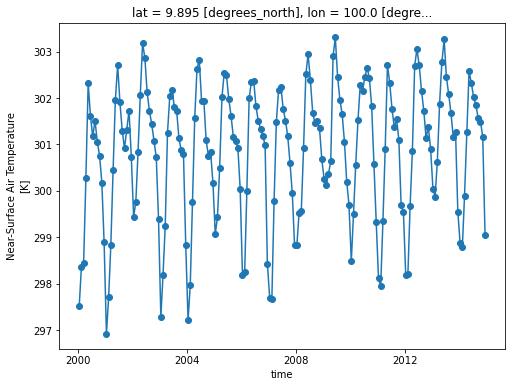

In [35]:
ds.tas.sel(lon=100, lat=10, method='nearest').plot(marker="o", size=6);

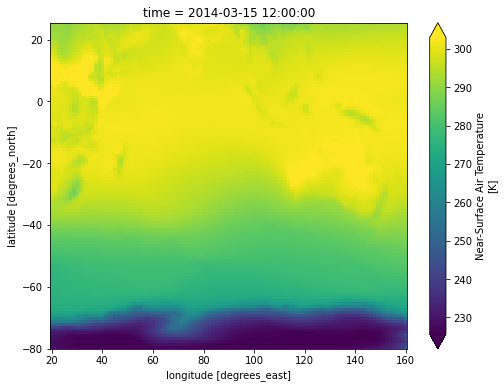

In [36]:
ds.tas.isel(time=-10).sel(lon=slice(20, 160), lat=slice(-80, 25)).plot(robust=True, figsize=(8, 6));

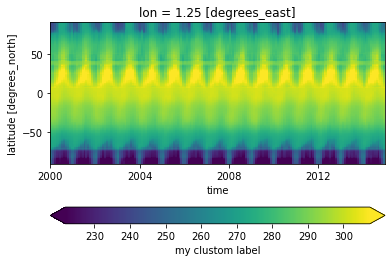

In [37]:
# define keyword arguments that are passed to matptolib.pyplot.colorbar
colorbar_kwargs = {
    "orientation": "horizontal",
    "label": "my clustom label",
    "pad": 0.2,
}

ds.tas.isel(lon=1).plot(
    x="time",  # coordinate to plot on the x-axis of the plot
    robust=True,  # set colorbar limits to 2nd and 98th percentile of data
    cbar_kwargs=colorbar_kwargs,
);

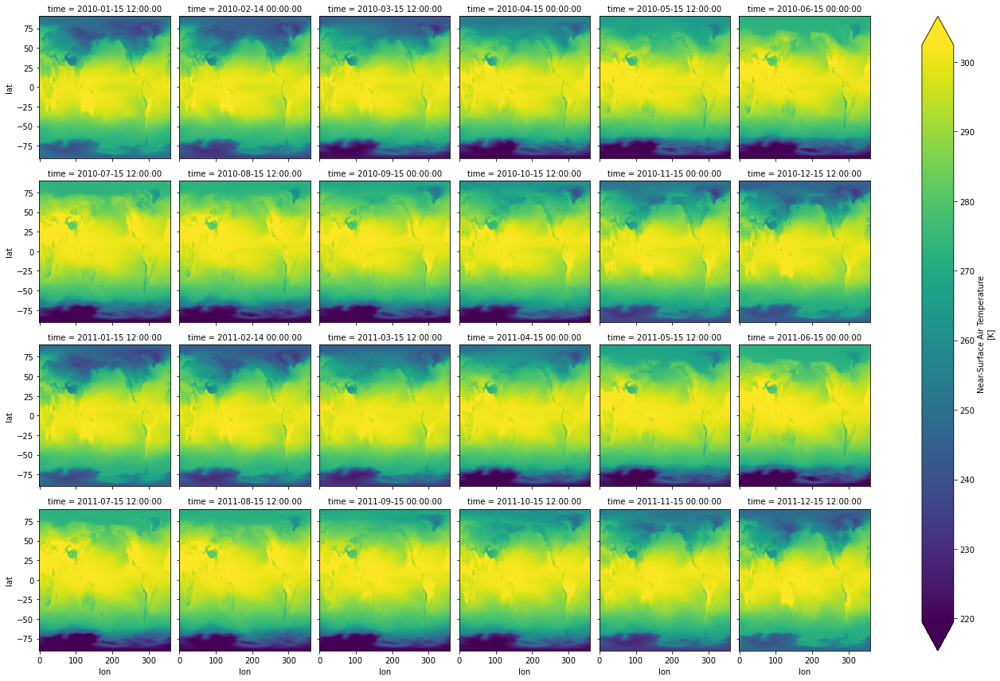

In [38]:
ds.tas.sel(time=slice("2010", "2011")).plot(col="time", col_wrap=6, robust=True);

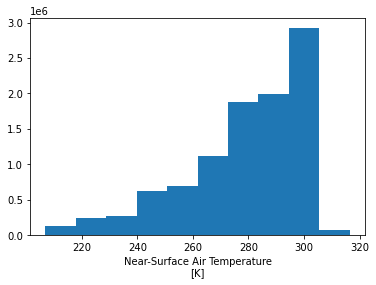

In [39]:
ds.tas.plot();

In [40]:
ds_air_all_pressure_levels = xr.open_dataset(
    "data/ta_Amon_CESM2_historical_r11i1p1f1_gn_200001-201412.nc", engine="netcdf4"
)
ds_air_all_pressure_levels

<xarray.Dataset>
Dimensions:    (time: 180, plev: 19, lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * plev       (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Dimensions without coordinates: nbnd
Data variables:
    ta         (time, plev, lat, lon) float32 ...
    time_bnds  (time, nbnd) object ...
    lat_bnds   (lat, nbnd) float64 ...
    lon_bnds   (lon, nbnd) float64 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Amon
    tracking_id:            hdl:21.14100/9d756bc9-46db-4896-9c81-d6c7e473c2d0
    variable_id:            ta
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

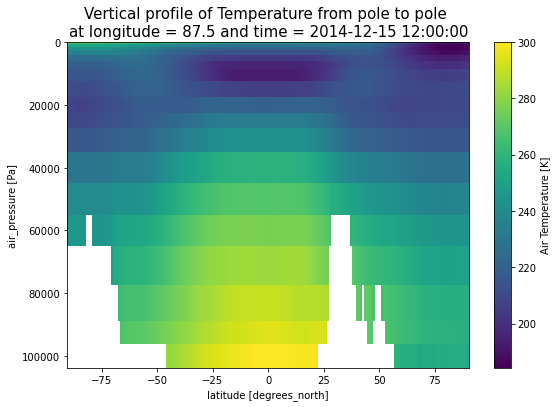

In [41]:
data = ds_air_all_pressure_levels.ta.isel(time=-1).sel(lon=86.93, method='nearest')
fig = data.plot(size=6, yincrease=False)
fig.axes.set_title(
    f'Vertical profile of Temperature from pole to pole \nat longitude = {data.lon.data} and time = {data.time.data}',
    size=15,
);

In [42]:
import hvplot.xarray

In [43]:
ds.tas.hvplot()

:NdOverlay   [Element]
   :Histogram   [tas]   (tas_count)

In [44]:
ds.tas.isel(time=1).hvplot(cmap="fire")

:Image   [lon,lat]   (tas)

In [45]:
ds.tas.isel(time=-1, lon=100).hvplot()

:Curve   [lat]   (tas)

In [46]:
ds.tas.sel(lat=28.5, lon=83.9, method='nearest').hvplot()

:Curve   [time]   (tas)

In [47]:
ds.tas.hvplot(groupby="time", clim=(ds.tas.min(), ds.tas.max()), cmap='turbo')

:DynamicMap   [time]
   :Image   [lon,lat]   (tas)

In [49]:
ds.tas.hvplot(
    groupby="time",
    clim=(ds.tas.min(), ds.tas.max()),
    cmap="turbo",
    widget_type="scrubber",
    widget_location="bottom",
)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=179, width=550)
        [2] HSpacer()

In [50]:
import matplotlib.pyplot as plt

In [51]:
ds = xr.open_dataset(
    "./data/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc", engine="netcdf4"
)
ds

<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 180, lon: 360)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 ...
    lon_bnds   (lon, d2) float64 ...
    tos        (time, lat, lon) float32 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [52]:
ds.tos + 273.15

<xarray.DataArray 'tos' (time: 180, lat: 180, lon: 360)>
array([[[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [271.3552 , 271.3553 , 271.3554 , ..., 271.35495, 271.355  ,
         271.3551 ],
        [271.36005, 271.36014, 271.36023, ..., 271.35986, 271.35992,
         271.36   ],
        [271.36447, 271.36453, 271.3646 , ..., 271.3643 , 271.36435,
         271.3644 ]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
...
        [271.40677, 271.40674, 271.4067 , ..., 271.40695, 271.4069 ,
         271.40683],
        [271.41296, 271.41293, 271.41293, ..., 271.41306, 271.413  ,
         271.41296],
        [271.41772, 271.41772, 271.41772, ..., 271.41766, 271.4177 ,
         271.4177 ]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [271.39386, 271.39383, 271.3938 , ..., 271.39407, 271.394  ,
         271.39392],
        [271.39935, 271.39932, 271.39932, ..., 271.39948, 271.39944,
         271.39938],
        [271.40372, 271.40372, 271.40375, ..., 271.4037 , 271.4037 ,
         271.40372]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

In [53]:
ds.tos ** 2

<xarray.DataArray 'tos' (time: 180, lat: 180, lon: 360)>
array([[[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [3.2213385, 3.2209656, 3.220537 , ..., 3.2221622, 3.221913 ,
         3.2216525],
        [3.203904 , 3.203617 , 3.2032912, ..., 3.2045207, 3.2043478,
         3.2041442],
        [3.1881146, 3.1879027, 3.1876712, ..., 3.188714 , 3.1885312,
         3.1883302]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
...
        [3.0388296, 3.0389647, 3.0390673, ..., 3.038165 , 3.0383828,
         3.0386322],
        [3.0173173, 3.0173445, 3.0173297, ..., 3.0169601, 3.0171173,
         3.0172386],
        [3.000791 , 3.0007784, 3.0007539, ..., 3.000933 , 3.000896 ,
         3.0008452]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [3.0839543, 3.0841148, 3.0842566, ..., 3.0832636, 3.0834875,
         3.0837412],
        [3.064733 , 3.0648024, 3.0648358, ..., 3.0642793, 3.0644639,
         3.0646174],
        [3.0494578, 3.0494475, 3.0494263, ..., 3.049596 , 3.0495603,
         3.0495107]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

In [54]:
# Compute mean
ds.tos.mean()

<xarray.DataArray 'tos' ()>
array(14.250171, dtype=float32)

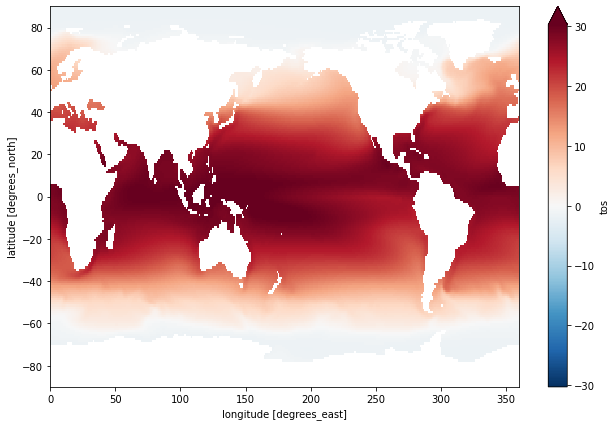

In [55]:
ds.tos.mean(dim='time').plot(size=7, robust=True);

In [56]:
# compute temporal min
ds.tos.min(dim=['time'])

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [-1.8083605, -1.8083031, -1.8082187, ..., -1.8083988, -1.8083944,
        -1.8083915],
       [-1.8025414, -1.8024837, -1.8024155, ..., -1.8026428, -1.8026177,
        -1.8025846],
       [-1.7984415, -1.7983989, -1.7983514, ..., -1.7985678, -1.7985296,
        -1.7984871]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

In [57]:
# compute spatial sum
ds.tos.sum(dim=['lat', 'lon'])

<xarray.DataArray 'tos' (time: 180)>
array([603767.  , 607702.5 , 603976.5 , 599373.56, 595119.94, 595716.75,
       598177.3 , 600670.6 , 597825.56, 591869.  , 590507.7 , 597189.2 ,
       605954.06, 609151.  , 606868.9 , 602329.9 , 599465.75, 601205.5 ,
       605144.4 , 608588.5 , 604046.9 , 598927.75, 597519.75, 603876.9 ,
       612424.44, 615765.2 , 612615.44, 606310.6 , 602034.4 , 600784.9 ,
       602013.5 , 603142.2 , 598850.9 , 591917.44, 589234.56, 596162.5 ,
       602942.06, 607196.9 , 604928.2 , 601735.6 , 599011.8 , 599490.9 ,
       600801.44, 602786.94, 598867.2 , 594081.8 , 593736.25, 598995.6 ,
       607285.25, 611901.06, 609562.75, 603527.3 , 600215.4 , 601372.6 ,
       604144.5 , 605376.75, 601256.2 , 595245.2 , 594002.06, 600490.4 ,
       611878.6 , 616563.  , 613050.8 , 605734.  , 600808.75, 600898.06,
       603930.56, 605644.7 , 599917.5 , 592048.06, 590082.8 , 596950.7 ,
       607701.94, 610844.7 , 609509.6 , 603380.94, 599838.1 , 600334.25,
       604386.6 , 607848.1 , 602155.2 , 594949.06, 593815.06, 598365.3 ,
       608730.8 , 612056.5 , 609922.5 , 603077.1 , 600134.1 , 602821.2 ,
       606152.75, 610257.8 , 604685.8 , 596858.  , 592894.8 , 599944.9 ,
       609764.44, 614610.75, 611434.75, 605606.4 , 603790.94, 605750.2 ,
       609250.06, 612935.7 , 609645.06, 601706.4 , 598896.5 , 605349.75,
       614671.8 , 618686.7 , 615895.2 , 609438.2 , 605399.56, 606126.75,
       607942.3 , 609680.4 , 604814.25, 595841.94, 591908.44, 595638.7 ,
       604798.94, 611327.1 , 609765.7 , 603727.56, 600970.  , 602514.  ,
       606303.7 , 609225.25, 603724.3 , 595944.8 , 594477.4 , 597807.4 ,
       607379.06, 611808.56, 610112.94, 607196.3 , 604733.06, 605488.25,
       610048.3 , 612655.75, 608906.25, 602349.7 , 601754.2 , 609220.4 ,
       619367.1 , 623783.2 , 619949.7 , 613369.06, 610190.8 , 611091.2 ,
       614213.44, 615665.06, 611722.2 , 606259.56, 605970.2 , 611463.3 ,
       619794.6 , 626036.5 , 623085.44, 616295.9 , 611886.3 , 611881.9 ,
       614420.75, 616853.56, 610375.44, 603471.5 , 602108.25, 608094.3 ,
       617450.7 , 623508.7 , 619830.2 , 612033.3 , 608737.2 , 610105.25,
       613692.7 , 616360.44, 611735.4 , 606512.7 , 604249.44, 608777.44],
      dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [58]:
# compute temporal median
ds.tos.median(dim='time')

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [-1.7648907, -1.7648032, -1.7647004, ..., -1.7650614, -1.7650102,
        -1.7649589],
       [-1.7590305, -1.7589546, -1.7588665, ..., -1.7591925, -1.7591486,
        -1.759095 ],
       [-1.7536805, -1.753602 , -1.7535168, ..., -1.753901 , -1.753833 ,
        -1.7537591]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

In [59]:
ds.tos.groupby(ds.time.dt.month)

DataArrayGroupBy, grouped over 'month'
12 groups with labels 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12.

In [60]:
ds.time.dt.year

<xarray.DataArray 'year' (time: 180)>
array([2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2009, 2009,
       2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2010,
       2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010,
       2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011,
       2011, 2012, 2012, 2012, 2012, 2012, 2012, 2012, 2012, 2012, 2012,
       2012, 2012, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013,
       2013, 2013, 2013, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014,
       2014, 2014, 2014, 2014])
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [61]:
ds.time.dt.month

<xarray.DataArray 'month' (time: 180)>
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,
        6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10,
       11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,
        4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,
        9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,
        2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11,
       12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,
        5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9,
       10, 11, 12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,
        3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00

In [62]:
ds.tos.groupby('time.month')

DataArrayGroupBy, grouped over 'month'
12 groups with labels 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12.

In [63]:
tos_clim = ds.tos.groupby('time.month').mean()
tos_clim

<xarray.DataArray 'tos' (month: 12, lat: 180, lon: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.780786 , -1.7806879, -1.7805718, ..., -1.7809757,
         -1.7809196, -1.7808627],
        [-1.7745041, -1.7744206, -1.7743237, ..., -1.7746699,
         -1.7746259, -1.7745715],
        [-1.7691481, -1.7690798, -1.7690052, ..., -1.7693441,
         -1.7692841, -1.7692183]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.7605034, -1.7603971, -1.7602727, ..., -1.760718 ,
         -1.7606541, -1.7605885],
        [-1.754429 , -1.7543423, -1.7542424, ..., -1.7546079,
         -1.7545592, -1.7545002],
        [-1.7492164, -1.7491481, -1.7490735, ..., -1.7494118,
         -1.749352 , -1.7492864]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7711829, -1.7710832, -1.7709652, ..., -1.771375 ,
         -1.7713183, -1.7712609],
        [-1.7648666, -1.7647841, -1.764688 , ..., -1.7650297,
         -1.7649866, -1.764933 ],
        [-1.759478 , -1.7594113, -1.7593385, ..., -1.7596704,
         -1.7596116, -1.759547 ]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes: (12/19)
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

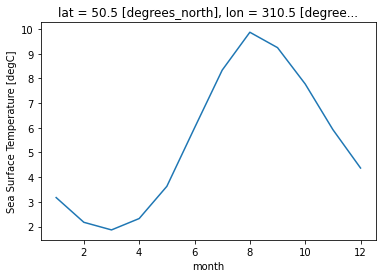

In [64]:
# Plot climatology at a specific point
tos_clim.sel(lon=310, lat=50, method='nearest').plot();

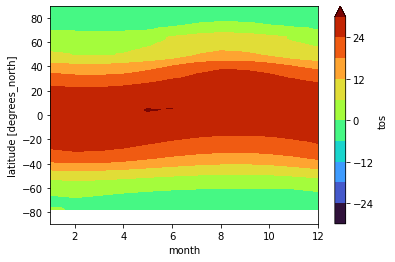

In [65]:
# Plot zonal mean climatology
tos_clim.mean(dim='lon').transpose().plot.contourf(levels=12, robust=True, cmap='turbo');

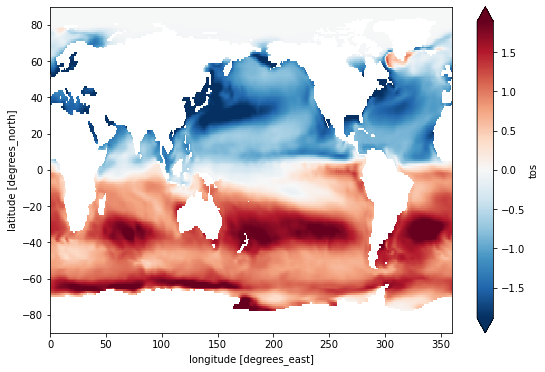

In [66]:
# Difference between January and December climatologies
(tos_clim.sel(month=1) - tos_clim.sel(month=12)).plot(size=6, robust=True);

In [67]:
gb = ds.tos.groupby('time.month')
tos_anom = gb - gb.mean(dim='time')
tos_anom

<xarray.DataArray 'tos' (time: 180, lat: 180, lon: 360)>
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-0.01402271, -0.01401699, -0.01401365, ..., -0.01406252,
         -0.01404929, -0.01403356],
        [-0.01544118, -0.01544452, -0.01545036, ..., -0.01544762,
         -0.01544333, -0.01544082],
        [-0.01638114, -0.01639009, -0.01639986, ..., -0.01635301,
         -0.01636171, -0.01637125]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [ 0.01727951,  0.01713443,  0.01698065, ...,  0.0176847 ,
          0.01755834,  0.01742125],
        [ 0.01738632,  0.01729178,  0.01719618, ...,  0.01766801,
          0.01757407,  0.01748013],
        [ 0.01693726,  0.01687264,  0.01680505, ...,  0.01709175,
          0.01704252,  0.01699162]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [ 0.01506376,  0.01491845,  0.01476002, ...,  0.0154525 ,
          0.0153321 ,  0.0152024 ],
        [ 0.0142287 ,  0.01412642,  0.0140208 , ...,  0.01452136,
          0.01442564,  0.01432812],
        [ 0.01320827,  0.01314461,  0.01307786, ...,  0.0133611 ,
          0.01331258,  0.01326215]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

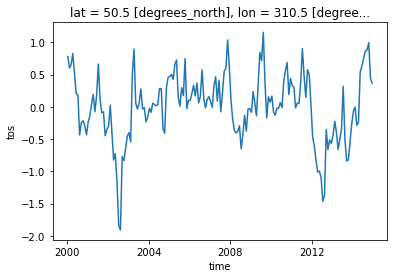

In [68]:
tos_anom.sel(lon=310, lat=50, method='nearest').plot();

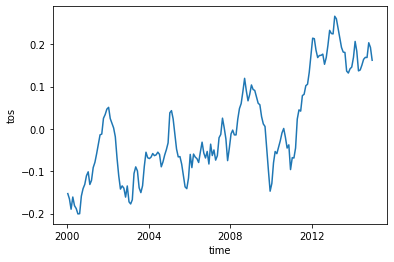

In [69]:
unweighted_mean_global_anom = tos_anom.mean(dim=['lat', 'lon'])
unweighted_mean_global_anom.plot();

In [70]:
areacello = xr.open_dataset("data/areacello_Ofx_CESM2_historical_r11i1p1f1_gr.nc").areacello
areacello

<xarray.DataArray 'areacello' (lat: 180, lon: 360)>
array([[1.078982e+08, 1.078982e+08, 1.078982e+08, ..., 1.078982e+08,
        1.078982e+08, 1.078982e+08],
       [3.236618e+08, 3.236618e+08, 3.236618e+08, ..., 3.236618e+08,
        3.236618e+08, 3.236618e+08],
       [5.393268e+08, 5.393268e+08, 5.393268e+08, ..., 5.393268e+08,
        5.393268e+08, 5.393268e+08],
       ...,
       [5.393268e+08, 5.393268e+08, 5.393268e+08, ..., 5.393268e+08,
        5.393268e+08, 5.393268e+08],
       [3.236618e+08, 3.236618e+08, 3.236618e+08, ..., 3.236618e+08,
        3.236618e+08, 3.236618e+08],
       [1.078982e+08, 1.078982e+08, 1.078982e+08, ..., 1.078982e+08,
        1.078982e+08, 1.078982e+08]])
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes: (12/17)
    cell_methods:   area: sum
    comment:        TAREA
    description:    Cell areas for any grid used to report ocean variables an...
    frequency:      fx
    id:             areacello
    long_name:      Grid-Cell Area for Ocean Variables
    ...             ...
    time_label:     None
    time_title:     No temporal dimensions ... fixed field
    title:          Grid-Cell Area for Ocean Variables
    type:           real
    units:          m2
    variable_id:    areacello

In [71]:
weighted_mean_global_anom = tos_anom.weighted(areacello).mean(dim=['lat', 'lon'])

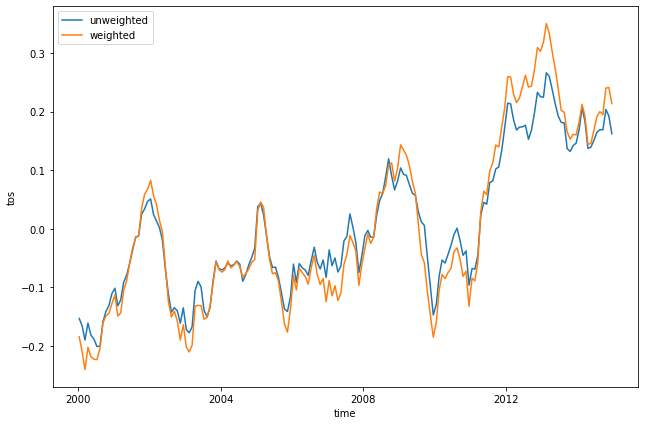

In [72]:
unweighted_mean_global_anom.plot(size=7)
weighted_mean_global_anom.plot()
plt.legend(['unweighted', 'weighted']);

In [73]:
# resample to annual frequency
r = ds.tos.resample(time='AS')
r

DataArrayResample, grouped over '__resample_dim__'
15 groups with labels 2000-01-01, 00:00:00, ..., 201....

In [74]:
r.mean()

<xarray.DataArray 'tos' (time: 15, lat: 180, lon: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7474421, -1.7474264, -1.7474008, ..., -1.7474308,
         -1.7474365, -1.7474445],
        [-1.7424873, -1.7424612, -1.7424251, ..., -1.7425357,
         -1.7425283, -1.7425116],
        [-1.7382039, -1.7381678, -1.7381277, ..., -1.7383199,
         -1.7382846, -1.7382454]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.6902231, -1.6899008, -1.6895409, ..., -1.6910189,
         -1.6907758, -1.6905179],
        [-1.6879102, -1.6876906, -1.6874666, ..., -1.6885366,
         -1.6883289, -1.688121 ],
        [-1.6883243, -1.6881752, -1.6880218, ..., -1.6886653,
         -1.6885543, -1.6884427]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.6893266, -1.6893964, -1.6894479, ..., -1.6889573,
         -1.6890832, -1.6892204],
        [-1.6776317, -1.6777302, -1.6778082, ..., -1.6771461,
         -1.6773273, -1.677492 ],
        [-1.672563 , -1.6726688, -1.6727763, ..., -1.6723491,
         -1.6724195, -1.6724887]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * time     (time) object 2000-01-01 00:00:00 ... 2014-01-01 00:00:00
Attributes: (12/19)
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

In [75]:
# Compute a 5-month moving average
m_avg = ds.tos.rolling(time=5, center=True).mean()
m_avg

<xarray.DataArray 'tos' (time: 180, lat: 180, lon: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]]], dtype=float32)
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes: (12/19)
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

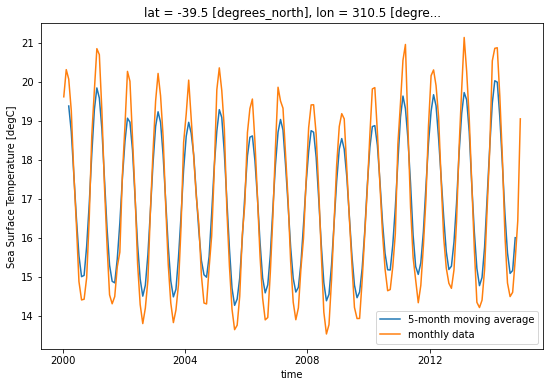

In [76]:
lat = 50
lon = 310

m_avg.isel(lat=lat, lon=lon).plot(size=6)
ds.tos.isel(lat=lat, lon=lon).plot()
plt.legend(['5-month moving average', 'monthly data']);

In [77]:
ds = xr.open_dataset(
    "./data/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc", engine="netcdf4"
)
ds

<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 180, lon: 360)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 ...
    lon_bnds   (lon, d2) float64 ...
    tos        (time, lat, lon) float32 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [78]:
sample = ds.tos.isel(time=-1)
sample

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[      nan,       nan,       nan, ...,       nan,       nan,       nan],
       [      nan,       nan,       nan, ...,       nan,       nan,       nan],
       [      nan,       nan,       nan, ...,       nan,       nan,       nan],
       ...,
       [-1.756119, -1.756165, -1.756205, ..., -1.755922, -1.755986, -1.756058],
       [-1.750638, -1.750658, -1.750667, ..., -1.750508, -1.750561, -1.750605],
       [-1.74627 , -1.746267, -1.746261, ..., -1.746309, -1.746299, -1.746285]],
      dtype=float32)
Coordinates:
    time     object 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes: (12/19)
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

In [79]:
sample.where?

Signature: sample.where(cond: 'Any', other: 'Any' = <NA>, drop: 'bool' = False) -> 'T_DataWithCoords'
Docstring:
Filter elements from this object according to a condition.

This operation follows the normal broadcasting and alignment rules that
xarray uses for binary arithmetic.

Parameters
----------
cond : DataArray, Dataset, or callable
    Locations at which to preserve this object's values. dtype must be `bool`.
    If a callable, it must expect this object as its only parameter.
other : scalar, DataArray or Dataset, optional
    Value to use for locations in this object where ``cond`` is False.
    By default, these locations filled with NA.
drop : bool, default: False
    If True, coordinate labels that only correspond to False values of
    the condition are dropped from the result.

Returns
-------
DataArray or Dataset
    Same xarray type as caller, with dtype float64.

Examples
--------
>>> a = xr.DataArray(np.arange(25).reshape(5, 5), dims=("x", "y"))
>>> a
<xarray.DataArra

In [80]:
masked_sample = sample.where(sample < 0.0)
masked_sample

<xarray.DataArray 'tos' (lat: 180, lon: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [-1.7561191, -1.7561648, -1.7562052, ..., -1.7559224, -1.7559862,
        -1.7560585],
       [-1.7506379, -1.7506577, -1.7506672, ..., -1.7505083, -1.750561 ,
        -1.7506049],
       [-1.7462697, -1.7462667, -1.7462606, ..., -1.7463093, -1.746299 ,
        -1.7462848]], dtype=float32)
Coordinates:
    time     object 2014-12-15 12:00:00
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes: (12/19)
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    comment:        Model data on the 1x1 grid includes values in all cells f...
    description:    This may differ from "surface temperature" in regions of ...
    frequency:      mon
    id:             tos
    ...             ...
    time_label:     time-mean
    time_title:     Temporal mean
    title:          Sea Surface Temperature
    type:           real
    units:          degC
    variable_id:    tos

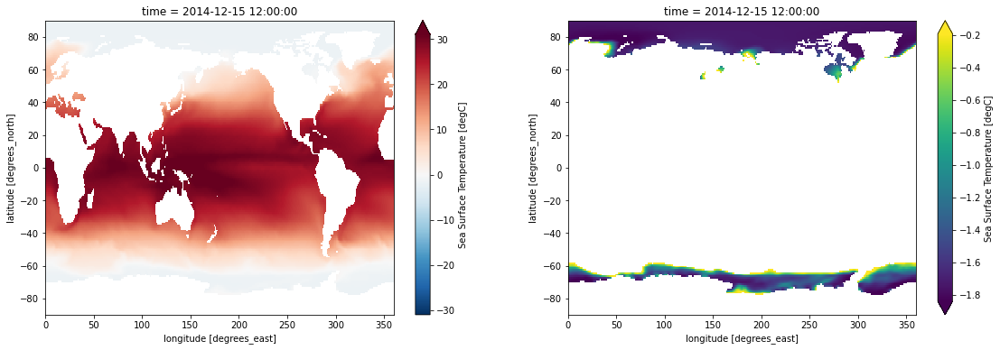

In [81]:
fig, axes = plt.subplots(ncols=2, figsize=(19, 6))
sample.plot(ax=axes[0], robust=True)
masked_sample.plot(ax=axes[1], robust=True);

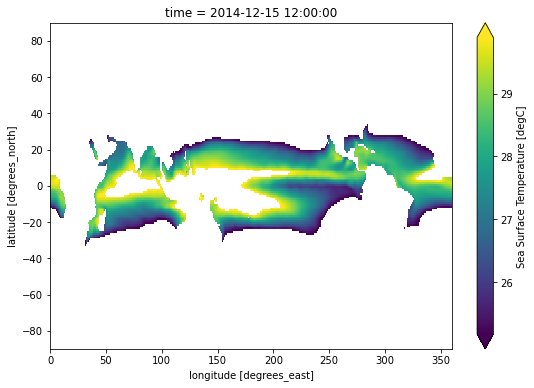

In [82]:
sample.where((sample > 25) & (sample < 30)).plot(size=6, robust=True);

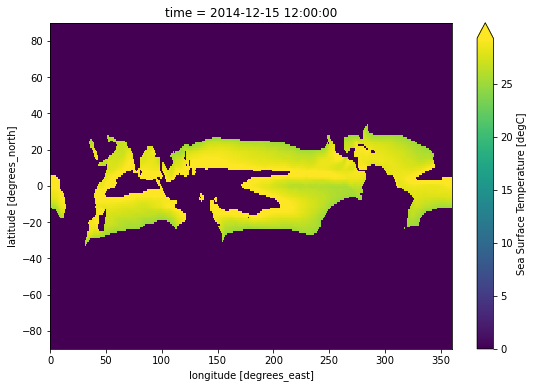

In [83]:
sample.where((sample > 25) & (sample < 30), 0).plot(size=6, robust=True);

In [84]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import xarray as xr

ModuleNotFoundError: No module named 'cartopy'

In [85]:
data = xr.open_dataset(
    "./data/tos_Omon_CESM2_historical_r11i1p1f1_gr_200001-201412.nc", engine="netcdf4"
)
areacello = xr.open_dataset(
    "./data/areacello_Ofx_CESM2_historical_r11i1p1f1_gr.nc", engine="netcdf4"
)

# Merge the two datasets in a single dataset
ds = xr.merge([data, areacello])
ds

<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 180, lon: 360, lev: 33)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * lev        (lev) float64 0.0 10.0 20.0 30.0 ... 4e+03 4.5e+03 5e+03 5.5e+03
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 -90.0 -89.0 -89.0 -88.0 ... 88.0 89.0 89.0 90.0
    lon_bnds   (lon, d2) float64 0.0 1.0 1.0 2.0 2.0 ... 358.0 359.0 359.0 360.0
    tos        (time, lat, lon) float32 ...
    lev_bnds   (lev, d2) float64 ...
    areacello  (lat, lon) float64 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [86]:
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.coastlines()
ax.gridlines()
ds.tos.isel(time=0).plot(
    robust=True, ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'shrink': 0.5}
)
ax.set_global()

NameError: name 'ccrs' is not defined

<Figure size 864x432 with 0 Axes>

In [87]:
tos_nino34 = ds.sel(lat=slice(-5, 5), lon=slice(190, 240))
tos_nino34

<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 10, lon: 50, lev: 33)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -4.5 -3.5 -2.5 -1.5 -0.5 0.5 1.5 2.5 3.5 4.5
  * lon        (lon) float64 190.5 191.5 192.5 193.5 ... 236.5 237.5 238.5 239.5
  * lev        (lev) float64 0.0 10.0 20.0 30.0 ... 4e+03 4.5e+03 5e+03 5.5e+03
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object 2000-01-01 00:00:00 ... 2015-01-01 00:00:00
    lat_bnds   (lat, d2) float64 -5.0 -4.0 -4.0 -3.0 -3.0 ... 3.0 4.0 4.0 5.0
    lon_bnds   (lon, d2) float64 190.0 191.0 191.0 192.0 ... 239.0 239.0 240.0
    tos        (time, lat, lon) float32 ...
    lev_bnds   (lev, d2) float64 0.0 5.0 5.0 15.0 ... 5.25e+03 5.25e+03 5.5e+03
    areacello  (lat, lon) float64 1.233e+10 1.233e+10 ... 1.233e+10 1.233e+10
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

In [88]:
fig = plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180))
ax.coastlines()
ax.gridlines()
tos_nino34.tos.isel(time=0).plot(ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'shrink': 0.5})
ax.set_extent((120, 300, 10, -10))

NameError: name 'ccrs' is not defined

<Figure size 864x432 with 0 Axes>

In [89]:
gb = tos_nino34.tos.groupby('time.month')
tos_nino34_anom = gb - gb.mean(dim='time')
index_nino34 = tos_nino34_anom.weighted(tos_nino34.areacello).mean(dim=['lat', 'lon'])

In [90]:
index_nino34_rolling_mean = index_nino34.rolling(time=5).mean()

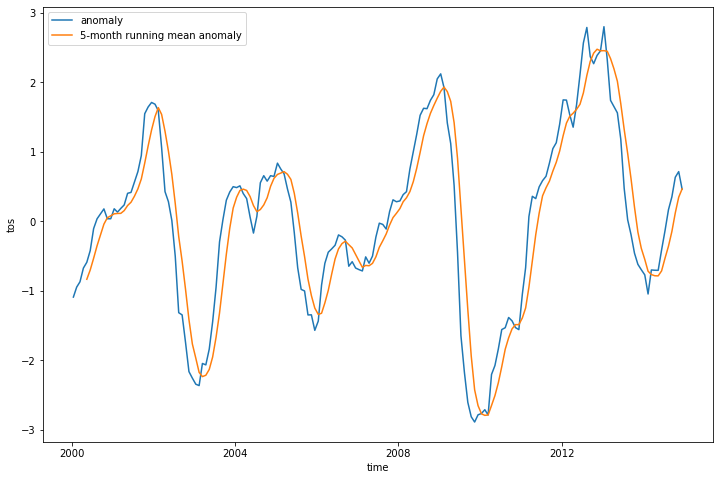

In [91]:
index_nino34.plot(size=8)
index_nino34_rolling_mean.plot()
plt.legend(['anomaly', '5-month running mean anomaly']);

In [92]:
std_dev = tos_nino34.tos.std()
std_dev

<xarray.DataArray 'tos' ()>
array(1.84363365)

In [93]:
normalized_index_nino34_rolling_mean = index_nino34_rolling_mean / std_dev

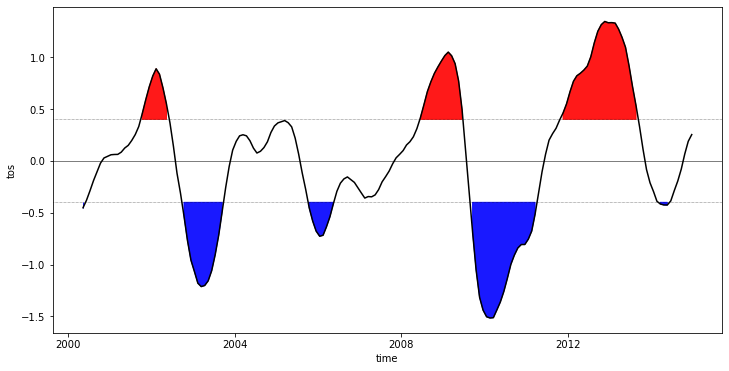

In [94]:
fig = plt.figure(figsize=(12, 6))

# Add -0.4/+0.4 lines which are the El Niño 3.4 thresholds
plt.fill_between(
    normalized_index_nino34_rolling_mean.time.data,
    normalized_index_nino34_rolling_mean.where(normalized_index_nino34_rolling_mean >= 0.4).data,
    0.4,
    color='red',
    alpha=0.9,
)
plt.fill_between(
    normalized_index_nino34_rolling_mean.time.data,
    normalized_index_nino34_rolling_mean.where(normalized_index_nino34_rolling_mean <= -0.4).data,
    -0.4,
    color='blue',
    alpha=0.9,
)

normalized_index_nino34_rolling_mean.plot(color='black')
plt.axhline(0, color='black', lw=0.5)
plt.axhline(0.4, color='black', linewidth=0.5, linestyle='dotted')
plt.axhline(-0.4, color='black', linewidth=0.5, linestyle='dotted');